In [48]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import geopy.distance
import folium
import datetime
from folium.plugins import HeatMap
from scipy.stats import ttest_ind
from math import radians,cos,sin,asin,sqrt

In [3]:
data=pd.read_csv('/content/uber-raw-data-jul14.csv')


In [4]:
data.head(20)

,Date/Time,Lat,Lon,Base
0,7/1/2014 0:03:00,40.7586,-73.9706,B02512
1,7/1/2014 0:05:00,40.7605,-73.9994,B02512
2,7/1/2014 0:06:00,40.7320,-73.9999,B02512
3,7/1/2014 0:09:00,40.7635,-73.9793,B02512
4,7/1/2014 0:20:00,40.7204,-74.0047,B02512
5,7/1/2014 0:35:00,40.7487,-73.9869,B02512
6,7/1/2014 0:57:00,40.7444,-73.9961,B02512
7,7/1/2014 0:58:00,40.7132,-73.9492,B02512
8,7/1/2014 1:04:00,40.7590,-73.9730,B02512
9,7/1/2014 1:08:00,40.7601,-73.9823,B02512


In [5]:
type(data.loc[0,'Date/Time'])

str

In [6]:
data['Date/Time'] = pd.to_datetime(data['Date/Time'])

In [7]:
data['BinnedHour']=data['Date/Time'].dt.floor('15min')

In [8]:
data['BinnedHour']

0        2014-07-01 00:00:00
1        2014-07-01 00:00:00
2        2014-07-01 00:00:00
3        2014-07-01 00:00:00
4        2014-07-01 00:15:00
                 ...        
796116   2014-07-31 23:15:00
796117   2014-07-31 23:15:00
796118   2014-07-31 23:15:00
796119   2014-07-31 23:30:00
796120   2014-07-31 23:45:00
Name: BinnedHour, Length: 796121, dtype: datetime64[ns]

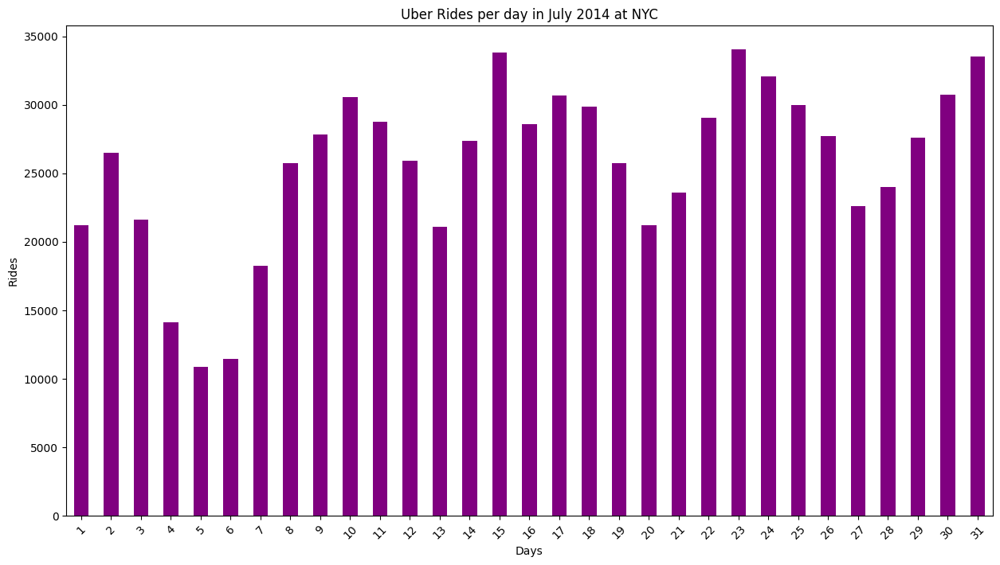

In [16]:
plt.figure(figsize=(15,8))
data['BinnedHour'].dt.day.value_counts().sort_index().plot(kind='bar',color='purple')
for item in plt.gca().get_xticklabels():
    item.set_rotation(45)
plt.title('Uber Rides per day in July 2014 at NYC')
plt.xlabel('Days')
_=plt.ylabel('Rides')

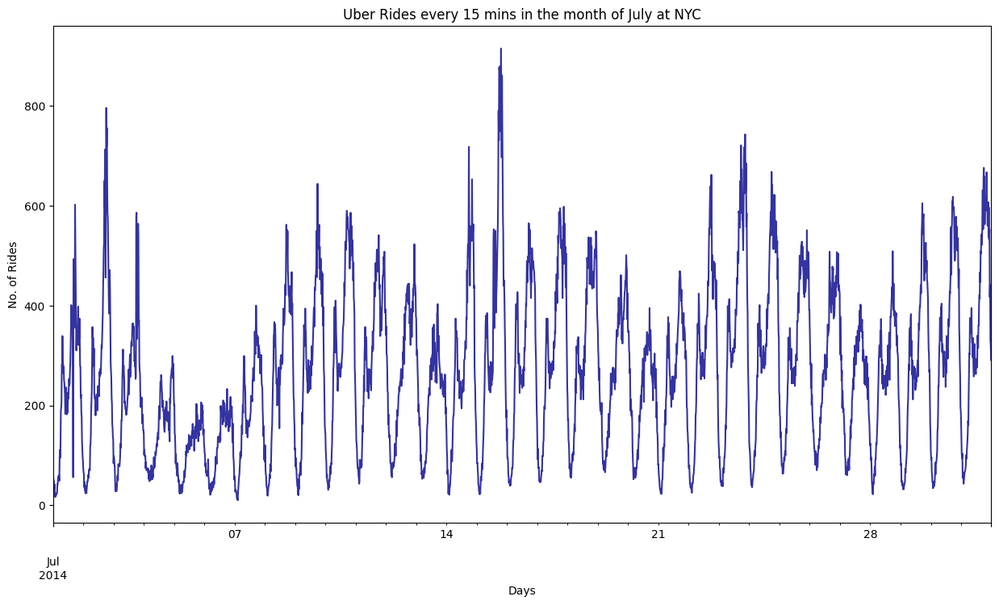

In [17]:
plt.figure(figsize=(15,8))
data['BinnedHour'].value_counts().sort_index().plot(c='darkblue',alpha=0.8)
plt.title('Uber Rides every 15 mins in the month of July at NYC')
plt.xlabel('Days')
_=plt.ylabel('No. of Rides')

In [18]:
data['BinnedHour'].value_counts()

BinnedHour
2014-07-15 19:15:00    915
2014-07-15 18:15:00    879
2014-07-15 17:45:00    877
2014-07-15 18:00:00    872
2014-07-15 20:00:00    861
                      ... 
2014-07-01 02:00:00     17
2014-07-07 01:45:00     15
2014-07-07 02:15:00     14
2014-07-07 02:00:00     12
2014-07-07 02:30:00     10
Name: count, Length: 2976, dtype: int64

In [20]:
DayMap={0:'Monday', 1:'Tuesday', 2:'Wednesday', 3:'Thursday', 4:'Friday', 5:'Saturday', 6:'Sunday'}
data['Day']=data['BinnedHour'].dt.weekday.map(DayMap)

In [21]:
data['Date']=data['BinnedHour'].dt.date

In [22]:
data['Day']=pd.Categorical(data['Day'],categories=['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'],ordered=True)

In [23]:
data['Time']=data['BinnedHour'].dt.time

In [24]:
weekly_data = data.groupby(['Date','Day','Time']).count().dropna().rename(columns={'BinnedHour':'Rides'})['Rides'].reset_index()
weekly_data.head(10)

,Date,Day,Time,Rides
0,2014-07-01,Monday,00:00:00,0
1,2014-07-01,Monday,00:15:00,0
2,2014-07-01,Monday,00:30:00,0
3,2014-07-01,Monday,00:45:00,0
4,2014-07-01,Monday,01:00:00,0
5,2014-07-01,Monday,01:15:00,0
6,2014-07-01,Monday,01:30:00,0
7,2014-07-01,Monday,01:45:00,0
8,2014-07-01,Monday,02:00:00,0
9,2014-07-01,Monday,02:15:00,0


In [26]:
daywise = weekly_data.groupby('Day')['Rides'].sum()
daywise

Day
Monday        93189
Tuesday      137454
Wednesday    147717
Thursday     148439
Friday       102735
Saturday      90260
Sunday        76327
Name: Rides, dtype: int64

<ipython-input-29-a50b53936cd3>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax=sns.barplot(x = daywise.index,y= vals,palette=colorPal)
<ipython-input-29-a50b53936cd3>:10: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  ax=sns.barplot(x = daywise.index,y= vals,palette=colorPal)


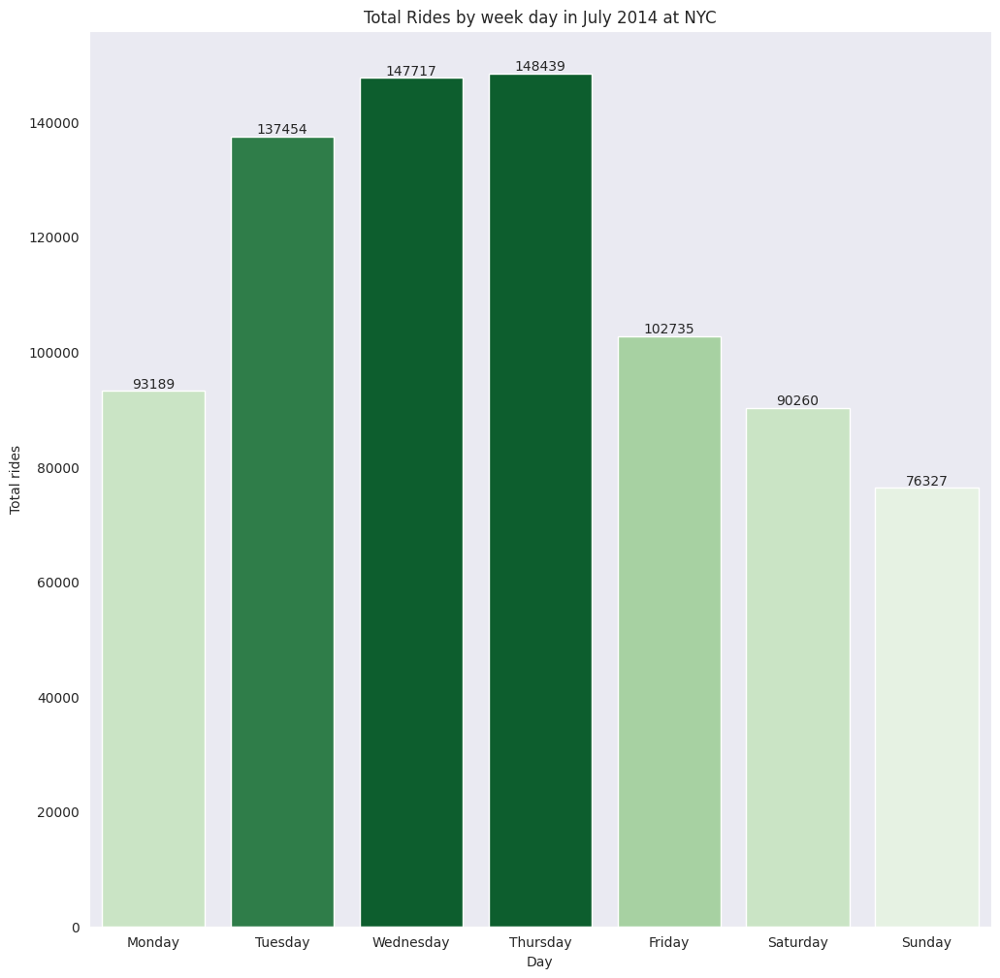

In [29]:
sns.set_style("dark")
plt.figure(figsize=(12,12))

vals = daywise.to_numpy().ravel()
normalized = (vals - np.min(vals)) / (np.max(vals) - np.min(vals))
indices = np.round(normalized * (len(vals) - 1)).astype(np.int32)
palette = sns.color_palette('Greens', len(vals))
colorPal = np.array(palette).take(indices, axis=0)

ax=sns.barplot(x = daywise.index,y= vals,palette=colorPal)
plt.ylabel('Total rides')
plt.title('Total Rides by week day in July 2014 at NYC')
for rect in ax.patches:
    ax.text(rect.get_x() + rect.get_width()/2.0,rect.get_height(),int(rect.get_height()), ha='center', va='bottom')

In [31]:
weekly_data = weekly_data.groupby(['Day','Time'])['Rides'].mean().reset_index() # Select the 'Rides' column before calculating the mean
weekly_data.head(10)

,Day,Time,Rides
0,Monday,00:00:00,13.225806
1,Monday,00:15:00,10.967742
2,Monday,00:30:00,8.741935
3,Monday,00:45:00,7.709677
4,Monday,01:00:00,6.935484
5,Monday,01:15:00,5.354839
6,Monday,01:30:00,3.838710
7,Monday,01:45:00,3.645161
8,Monday,02:00:00,2.612903
9,Monday,02:15:00,3.161290


In [32]:
weekly_data= weekly_data.unstack(level=0)
weekly_data

Day    0         Monday
       1         Monday
       2         Monday
       3         Monday
       4         Monday
                ...    
Rides  667    26.322581
       668    21.258065
       669    18.870968
       670    17.354839
       671    13.419355
Length: 2016, dtype: object

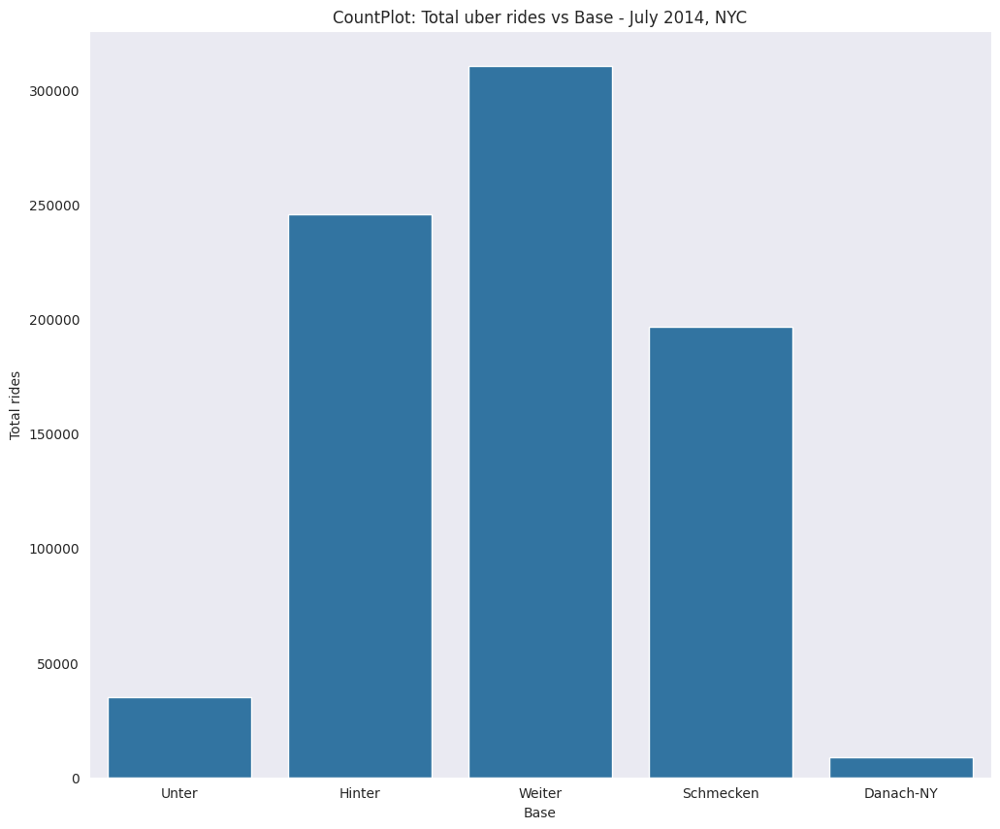

In [45]:
#A mapper to map base number with its name
BaseMapper={'B02512' : 'Unter', 'B02598' : 'Hinter', 'B02617' : 'Weiter', 'B02682' : 'Schmecken','B02764' : 'Danach-NY'}

#Count plot of Base
plt.figure(figsize=(12,10))
sns.set_style("dark")
_=sns.countplot(x=data['Base'].map(BaseMapper))
plt.ylabel('Total rides')
_=plt.title('CountPlot: Total uber rides vs Base - July 2014, NYC')

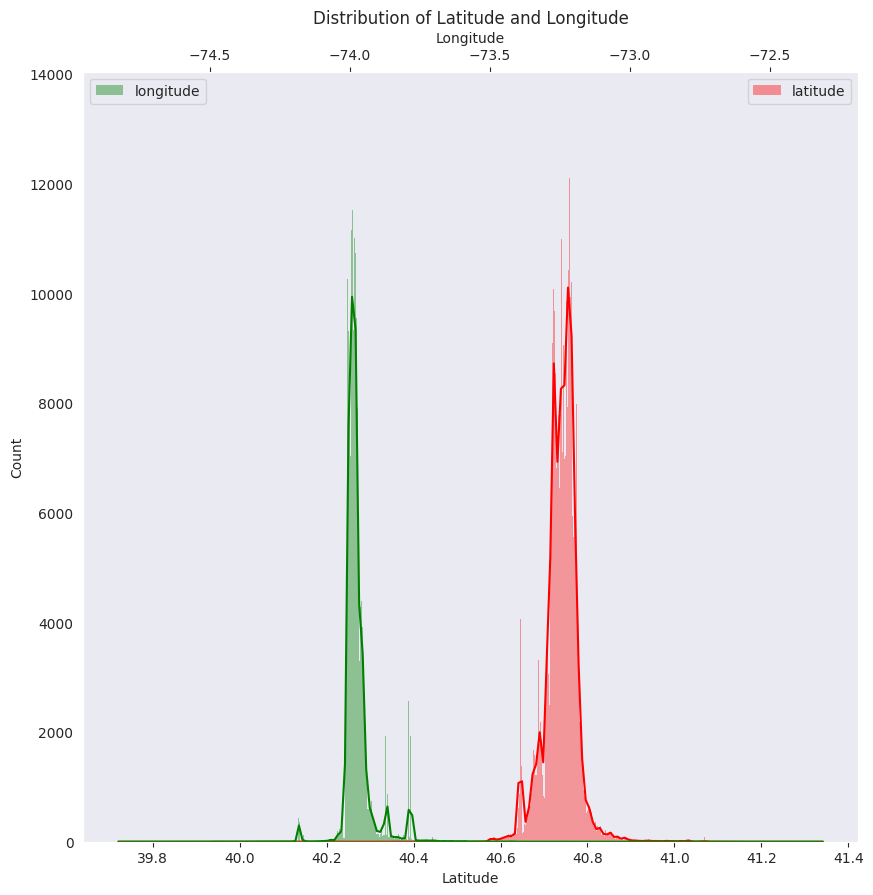

In [46]:
plt.figure(figsize=(10,10))
sns.histplot(data['Lat'], bins='auto',kde=True,color='r',alpha=0.4,label = 'latitude')
plt.legend(loc='upper right')
plt.xlabel('Latitude')
plt.twiny()
sns.histplot(data['Lon'], bins='auto',kde=True,color='g',alpha=0.4,label = 'longitude')
_=plt.legend(loc='upper left')
_=plt.xlabel('Longitude')
_=plt.title('Distribution of Latitude and Longitude')


In [47]:
metro_art_coordinates = (40.7794,-73.9632)
empire_state_building_coordinates = (40.7484,-73.9857)

distance = geopy.distance.distance(metro_art_coordinates,empire_state_building_coordinates)

print("Distance = ",distance)

Distance =  3.9319431838520242 km


In [49]:
def haversine(coordinates1,coordinates2):

    lat1=coordinates1[0]
    lon1=coordinates1[1]
    lat2=coordinates2[0]
    lon2=coordinates2[1]

    #convert to radians and apply haverson formula
    lon1,lat1,lon2,lat2 = map(radians,[lon1,lat1,lon2,lat2])
    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = sin(dlat/2)**2 + cos(lat1)*cos(lat2)*sin(dlon/2)**2
    c = 2*asin(sqrt(a))
    r = 3956
    return c*r
print("Distance (mi) = ",haversine(metro_art_coordinates,empire_state_building_coordinates))

Distance (mi) =  2.442501323483997


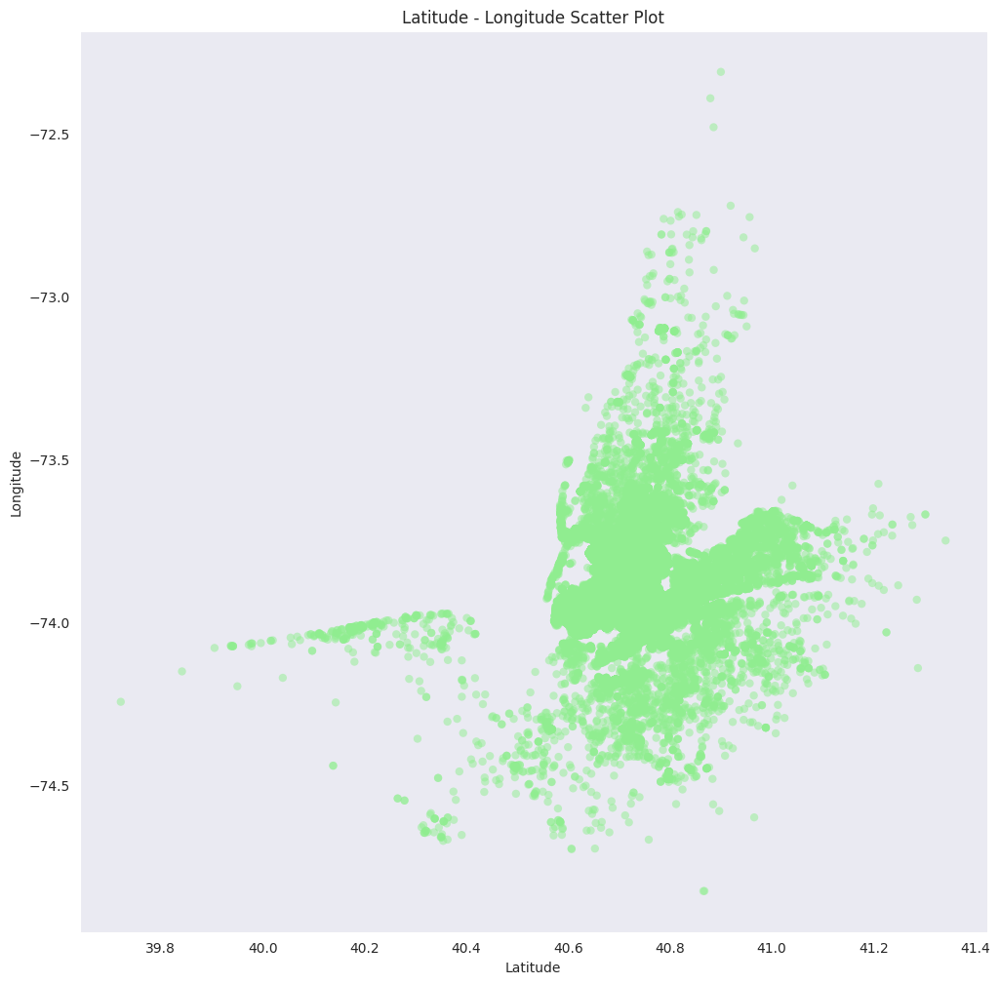

In [50]:
plt.figure(figsize=(12,12))
sns.scatterplot(x='Lat',y='Lon',data=data,edgecolor='None',alpha=0.5,color='lightgreen')
plt.xlabel('Latitude')
plt.ylabel('Longitude')
_=plt.title('Latitude - Longitude Scatter Plot')

In [51]:
metro_art_coordinates = (40.7794,-73.9632)
empire_state_building_coordinates = (40.7484,-73.9857)

distance = geopy.distance.distance(metro_art_coordinates,empire_state_building_coordinates)

print("Distance = ",distance)

Distance =  3.9319431838520242 km


In [52]:
data['Distance MM'] = data[['Lat','Lon']].apply(lambda x: haversine(metro_art_coordinates,tuple(x)),axis=1)
data['Distance ESB'] = data[['Lat','Lon']].apply(lambda x: haversine(empire_state_building_coordinates,tuple(x)),axis=1)

In [53]:
data.head(10)

,Date/Time,Lat,Lon,Base,BinnedHour,Day,Date,Time,Distance MM,Distance ESB
0,2014-07-01 00:03:00,40.7586,-73.9706,B02512,2014-07-01 00:00:00,Tuesday,2014-07-01,00:00:00,1.487358,1.058178
1,2014-07-01 00:05:00,40.7605,-73.9994,B02512,2014-07-01 00:00:00,Tuesday,2014-07-01,00:00:00,2.299140,1.100642
2,2014-07-01 00:06:00,40.7320,-73.9999,B02512,2014-07-01 00:00:00,Tuesday,2014-07-01,00:00:00,3.794105,1.354266
3,2014-07-01 00:09:00,40.7635,-73.9793,B02512,2014-07-01 00:00:00,Tuesday,2014-07-01,00:00:00,1.383450,1.094999
4,2014-07-01 00:20:00,40.7204,-74.0047,B02512,2014-07-01 00:15:00,Tuesday,2014-07-01,00:15:00,4.615925,2.173858
5,2014-07-01 00:35:00,40.7487,-73.9869,B02512,2014-07-01 00:30:00,Tuesday,2014-07-01,00:30:00,2.455439,0.066098
6,2014-07-01 00:57:00,40.7444,-73.9961,B02512,2014-07-01 00:45:00,Tuesday,2014-07-01,00:45:00,2.966517,0.610105
7,2014-07-01 00:58:00,40.7132,-73.9492,B02512,2014-07-01 00:45:00,Tuesday,2014-07-01,00:45:00,4.629089,3.090933
8,2014-07-01 01:04:00,40.7590,-73.9730,B02512,2014-07-01 01:00:00,Tuesday,2014-07-01,01:00:00,1.498848,0.988372
9,2014-07-01 01:08:00,40.7601,-73.9823,B02512,2014-07-01 01:00:00,Tuesday,2014-07-01,01:00:00,1.665310,0.827171


In [54]:
print((data[['Distance MM','Distance ESB']]<0.25).sum())

Distance MM      2764
Distance ESB    15133
dtype: int64


In [57]:
distance_range = np.arange(0.1,5.1,0.1)
distance_data = [(data[['Distance MM','Distance ESB']] < dist).sum() for dist in distance_range]

In [58]:
distance_data

[Distance MM      575
 Distance ESB    2387
 dtype: int64,
 Distance MM     1776
 Distance ESB    9661
 dtype: int64,
 Distance MM      4566
 Distance ESB    22166
 dtype: int64,
 Distance MM      8783
 Distance ESB    42427
 dtype: int64,
 Distance MM     13606
 Distance ESB    68011
 dtype: int64,
 Distance MM     20770
 Distance ESB    92650
 dtype: int64,
 Distance MM      29408
 Distance ESB    119621
 dtype: int64,
 Distance MM      38912
 Distance ESB    147815
 dtype: int64,
 Distance MM      50497
 Distance ESB    177759
 dtype: int64,
 Distance MM      63072
 Distance ESB    206056
 dtype: int64,
 Distance MM      75474
 Distance ESB    240003
 dtype: int64,
 Distance MM      89442
 Distance ESB    277785
 dtype: int64,
 Distance MM     105692
 Distance ESB    311312
 dtype: int64,
 Distance MM     123431
 Distance ESB    335385
 dtype: int64,
 Distance MM     141656
 Distance ESB    355731
 dtype: int64,
 Distance MM     157194
 Distance ESB    375017
 dtype: int64,
 Distanc

In [59]:
#concatentate and transpose
distance_data = pd.concat(distance_data,axis=1)
distance_data = distance_data.T

In [61]:
#Shifting index
distance_data.index = distance_range
distance_data=distance_data.rename(columns={'Distance MM':'CloserToMM','Distance ESB':'CloserToESB'})

Text(0, 0.5, 'Rides')

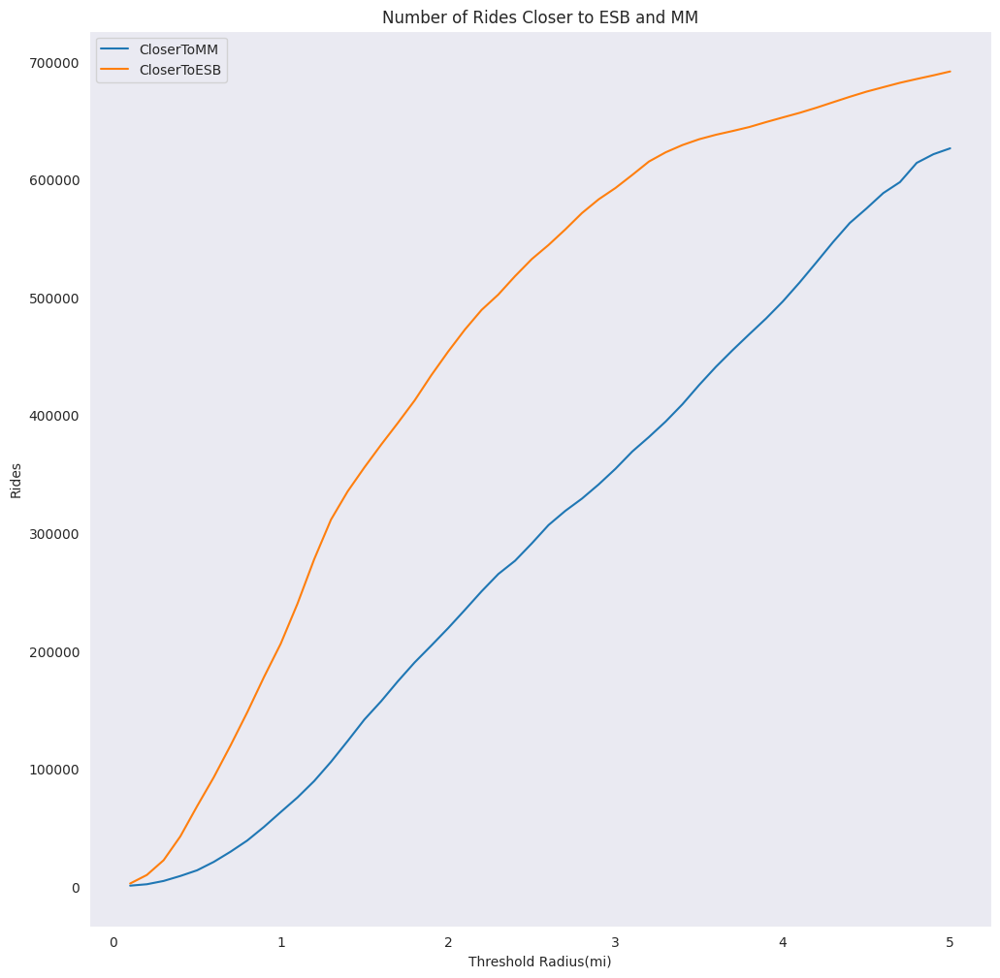

In [62]:
plt.figure(figsize=(12,12))
distance_data.plot(ax=plt.gca())
plt.title('Number of Rides Closer to ESB and MM')
plt.xlabel('Threshold Radius(mi)')
plt.ylabel('Rides')

In [64]:
uber_map = folium.Map(location=metro_art_coordinates,zoom_start=10)

#lets mark MM and ESB on the map
folium.Marker(metro_art_coordinates,popup = "MM").add_to(uber_map)
folium.Marker(empire_state_building_coordinates,popup = "ESB").add_to(uber_map)

#convert to numpy array and plot it
Lat_Lon = data[['Lat','Lon']].to_numpy()
folium.plugins.HeatMap(Lat_Lon,radius=10).add_to(uber_map)

#Displaying the map
uber_map

In [65]:
i = data[['Distance MM','Distance ESB']] < 0.25
i.head(10)

,Distance MM,Distance ESB
0,False,False
1,False,False
2,False,False
3,False,False
4,False,False
5,False,True
6,False,False
7,False,False
8,False,False
9,False,False


In [68]:
map_data = data[i].copy()
map_data['Weight'] = 0.1
map_data = data[data["BinnedHour"] < datetime.datetime(2014,7,8)].copy()
map_data['Weight'] = 0.1
map_data = map_data.groupby("BinnedHour").apply(lambda x: x[['Lat','Lon','Weight']].sample(int(len(x)/3)).to_numpy().tolist())

In [69]:
map_data

BinnedHour
2014-07-01 00:00:00    [[40.7906, -73.9777, 0.1], [40.7599, -73.9822,...
2014-07-01 00:15:00    [[40.7579, -73.9849, 0.1], [40.7305, -73.9923,...
2014-07-01 00:30:00    [[40.7455, -73.9951, 0.1], [40.7366, -73.9554,...
2014-07-01 00:45:00    [[40.6882, -73.9606, 0.1], [40.7445, -74.0066,...
2014-07-01 01:00:00    [[40.7607, -73.9794, 0.1], [40.7599, -73.9733,...
                                             ...                        
2014-07-07 22:45:00    [[40.72, -73.9613, 0.1], [40.7534, -73.9691, 0...
2014-07-07 23:00:00    [[40.6448, -73.7819, 0.1], [40.774, -73.8717, ...
2014-07-07 23:15:00    [[40.7142, -73.9652, 0.1], [40.7761, -73.9471,...
2014-07-07 23:30:00    [[40.6446, -73.7822, 0.1], [40.7135, -73.9718,...
2014-07-07 23:45:00    [[40.7606, -73.9824, 0.1], [40.8611, -73.926, ...
Length: 672, dtype: object

In [70]:
data_hour_index = [x.strftime("%m%d%Y, %H:%M:%S") for x in map_data.index]
date_hour_data = map_data.tolist()
uber_map = folium.Map(location=metro_art_coordinates,zoom_start=10)

In [71]:
hm = folium.plugins.HeatMapWithTime(date_hour_data,index=date_hour_data)
hm.add_to(uber_map)
uber_map

In [73]:
data

,Date/Time,Lat,Lon,Base,BinnedHour,Day,Date,Time,Distance MM,Distance ESB
0,2014-07-01 00:03:00,40.7586,-73.9706,B02512,2014-07-01 00:00:00,Tuesday,2014-07-01,00:00:00,1.487358,1.058178
1,2014-07-01 00:05:00,40.7605,-73.9994,B02512,2014-07-01 00:00:00,Tuesday,2014-07-01,00:00:00,2.299140,1.100642
2,2014-07-01 00:06:00,40.7320,-73.9999,B02512,2014-07-01 00:00:00,Tuesday,2014-07-01,00:00:00,3.794105,1.354266
3,2014-07-01 00:09:00,40.7635,-73.9793,B02512,2014-07-01 00:00:00,Tuesday,2014-07-01,00:00:00,1.383450,1.094999
4,2014-07-01 00:20:00,40.7204,-74.0047,B02512,2014-07-01 00:15:00,Tuesday,2014-07-01,00:15:00,4.615925,2.173858
...,...,...,...,...,...,...,...,...,...,...
796116,2014-07-31 23:22:00,40.7285,-73.9846,B02764,2014-07-31 23:15:00,Thursday,2014-07-31,23:15:00,3.688336,1.375205
796117,2014-07-31 23:23:00,40.7615,-73.9868,B02764,2014-07-31 23:15:00,Thursday,2014-07-31,23:15:00,1.746524,0.906320
796118,2014-07-31 23:29:00,40.6770,-73.9515,B02764,2014-07-31 23:15:00,Thursday,2014-07-31,23:15:00,7.096685,5.244699
796119,2014-07-31 23:30:00,40.7225,-74.0038,B02764,2014-07-31 23:30:00,Thursday,2014-07-31,23:30:00,4.465889,2.023519


In [82]:
for_ttest = data.groupby(['Date','Time']).count()['Day'].reset_index(level=1)

In [84]:
data.groupby(['Date']).count()['Day']


Date
2014-07-01    21228
2014-07-02    26480
2014-07-03    21597
2014-07-04    14148
2014-07-05    10890
2014-07-06    11443
2014-07-07    18280
2014-07-08    25763
2014-07-09    27817
2014-07-10    30541
2014-07-11    28752
2014-07-12    25936
2014-07-13    21082
2014-07-14    27350
2014-07-15    33845
2014-07-16    28607
2014-07-17    30710
2014-07-18    29860
2014-07-19    25726
2014-07-20    21212
2014-07-21    23578
2014-07-22    29029
2014-07-23    34073
2014-07-24    32050
2014-07-25    29975
2014-07-26    27708
2014-07-27    22590
2014-07-28    23981
2014-07-29    27589
2014-07-30    30740
2014-07-31    33541
Name: Day, dtype: int64

In [85]:
for_ttest = pd.concat([for_ttest['Day']/data.groupby(['Date']).count()['Day'],for_ttest['Time']],axis=1)
for_ttest=for_ttest.rename(columns={'Day':'NormalizedRides'})
for_ttest

,NormalizedRides,Time
Date,,
2014-07-01,0.003015,00:00:00
2014-07-01,0.002544,00:15:00
2014-07-01,0.002402,00:30:00
2014-07-01,0.002214,00:45:00
2014-07-01,0.001602,01:00:00
...,...,...
2014-07-31,0.012433,22:45:00
2014-07-31,0.013148,23:00:00
2014-07-31,0.009869,23:15:00


In [87]:
for_ttest = pd.concat([for_ttest,pd.to_datetime(for_ttest.reset_index()['Date']).dt.day_name().to_frame().set_index(for_ttest.index).rename(columns={'Date':'Day'})],axis=1)
for_ttest


,NormalizedRides,Time,Day,Day
Date,,,,
2014-07-01,0.003015,00:00:00,Tuesday,Tuesday
2014-07-01,0.002544,00:15:00,Tuesday,Tuesday
2014-07-01,0.002402,00:30:00,Tuesday,Tuesday
2014-07-01,0.002214,00:45:00,Tuesday,Tuesday
2014-07-01,0.001602,01:00:00,Tuesday,Tuesday
...,...,...,...,...
2014-07-31,0.012433,22:45:00,Thursday,Thursday
2014-07-31,0.013148,23:00:00,Thursday,Thursday
2014-07-31,0.009869,23:15:00,Thursday,Thursday


In [94]:
df = data.copy()

In [95]:
df['WeekDay']=df['Date/Time'].dt.weekday


In [97]:
def func(x):
    hr = float(x.hour)
    minute = int(x.minute/15)
    return hr + minute/4
df['Time']=df['Date/Time'].apply(func)

In [103]:
print(df.columns)
df = df.drop(['Date/Time','BinnedHour','Date','Distance MM','Distance ESB','Lat','Lon'],axis=1, errors='ignore')


Index(['Base', 'Day', 'Time', 'WeekDay'], dtype='object')


In [105]:
print(df.columns)
df = df.drop(['Date/Time','BinnedHour','Date','Distance MM','Distance ESB','Lat','Lon'], axis=1, errors='ignore')

Index(['Base', 'Day', 'Time', 'WeekDay'], dtype='object')


In [106]:
df['DropMe']=1
df = df.groupby(['Day','WeekDay','Time','Base']).count()['DropMe'].reset_index().rename(columns={'DropMe':'Rides'})
df

,Day,WeekDay,Time,Base,Rides
0,1,1,0.00,B02512,4
1,1,1,0.00,B02598,15
2,1,1,0.00,B02617,23
3,1,1,0.00,B02682,22
4,1,1,0.25,B02512,1
...,...,...,...,...,...
14193,31,3,23.75,B02512,7
14194,31,3,23.75,B02598,83
14195,31,3,23.75,B02617,130
14196,31,3,23.75,B02682,70


In [107]:
df['Weekend']=df.apply(lambda x: 1 if(x['WeekDay']>4) else 0,axis=1)

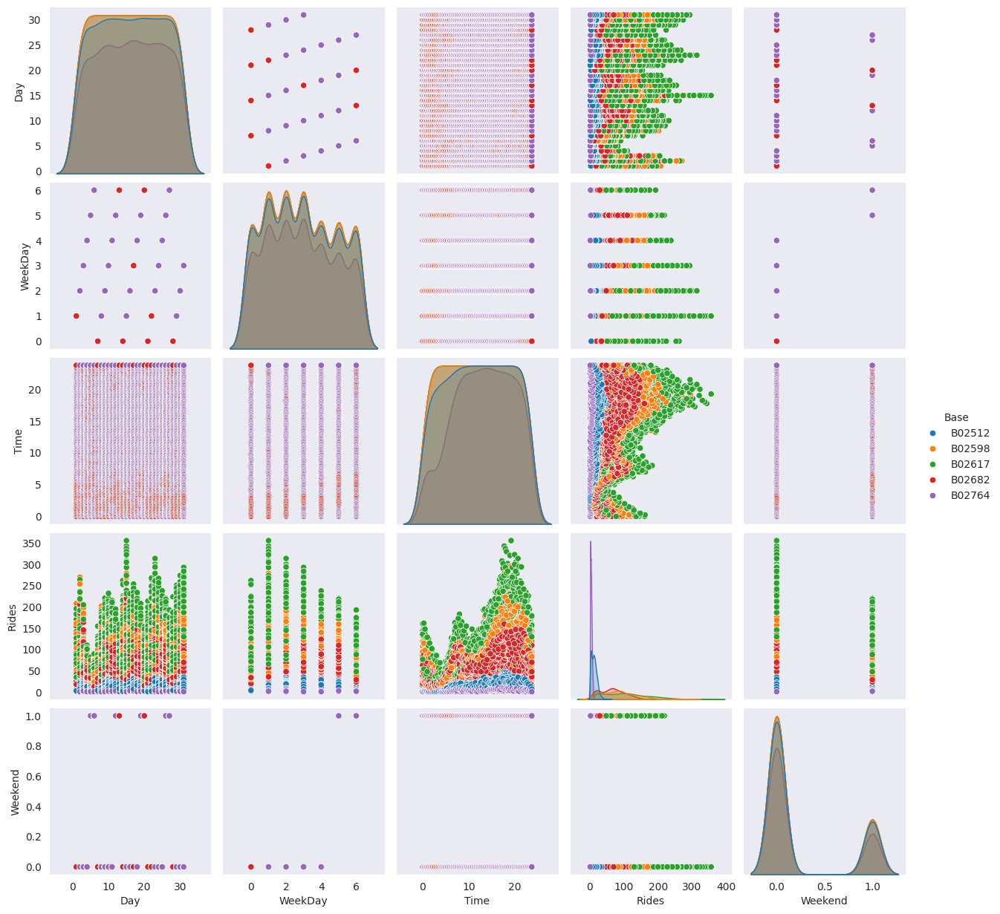

In [108]:
sns.pairplot(df,hue='Base')

<Figure size 640x480 with 0 Axes>

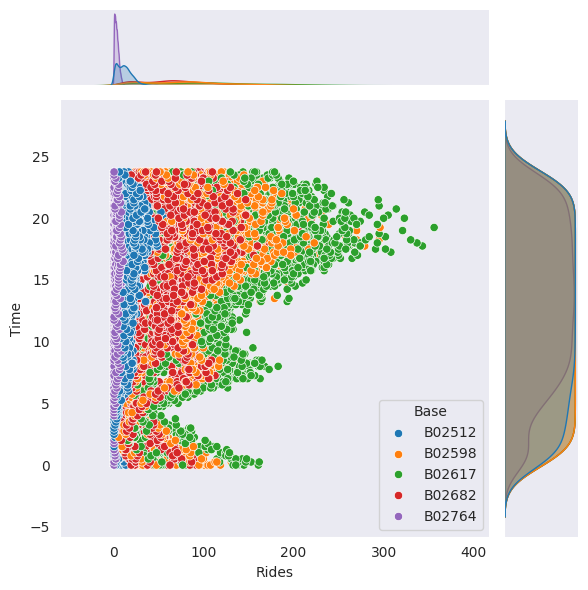

In [109]:
plt.figure()
_=sns.jointplot(x='Rides',y='Time',data = df,hue='Base')